In [ ]:
# with 15 samples of orig. data getting 500 samples of syn data

# https://www.kaggle.com/code/ankitapandav1212/dry-bean-dataset-using-knn-algorithm
# https://www.kaggle.com/code/ankitapandav1212/dry-bean-dataset-using-knn-algorithm?scriptVersionId=112288982&cellId=6
# to learn:
# data.info(), data.describe()
# https://www.kaggle.com/code/ankitapandav1212/dry-bean-dataset-using-knn-algorithm?scriptVersionId=112288982&cellId=20
# to learn:
# Imbalncing Technique, StratifiedKFold (?)

# https://www.kaggle.com/code/ziadhamadafathy/classify-dry-bean-with-accuracy-90-by-some-models
# to learn:
# sns.countplot(df['Class']), df['Class'].value_counts()
# SelectKBest for feature reduction


In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt 
import seaborn as sns
from sklearn.cluster import KMeans 
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import MinMaxScaler

In [2]:
iris = pd.read_csv("syn_bean.csv")
x = iris.iloc[:, [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15]].values
iris.info()
iris[0:10]

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2500 entries, 0 to 2499
Data columns (total 17 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Area             2500 non-null   float64
 1   Perimeter        2500 non-null   float64
 2   MajorAxisLength  2500 non-null   float64
 3   MinorAxisLength  2500 non-null   float64
 4   AspectRation     2500 non-null   float64
 5   Eccentricity     2500 non-null   float64
 6   ConvexArea       2500 non-null   float64
 7   EquivDiameter    2500 non-null   float64
 8   Extent           2500 non-null   float64
 9   Solidity         2500 non-null   float64
 10  roundness        2500 non-null   float64
 11  Compactness      2500 non-null   float64
 12  ShapeFactor1     2500 non-null   float64
 13  ShapeFactor2     2500 non-null   float64
 14  ShapeFactor3     2500 non-null   float64
 15  ShapeFactor4     2500 non-null   float64
 16  Class            2500 non-null   object 
dtypes: float64(16)

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,Class
0,30684.93,636.52,214.95,183.43,-1.19,1.13,31044.89,196.25,1.50,-0.21,1.63,2.16,0.56,0.21,1.18,1.13,SEKER
1,30278.91,634.09,211.82,181.05,2.32,-0.02,30599.52,197.72,0.41,-0.67,0.46,0.22,-0.63,0.47,0.75,2.23,SEKER
2,30477.81,672.15,212.56,184.27,2.27,-0.82,30968.79,198.15,0.16,-0.46,1.16,1.34,-0.01,0.20,1.33,0.18,SEKER
3,31107.35,640.34,215.23,183.97,0.40,0.37,31423.03,199.00,1.36,1.70,1.30,1.62,-0.23,-1.20,2.36,1.16,SEKER
4,30685.40,635.23,212.89,184.01,1.56,1.02,31043.46,198.50,0.39,2.09,2.00,1.76,0.56,0.65,0.27,0.92,SEKER
5,30476.76,667.88,211.56,185.61,0.63,2.25,30970.91,196.24,0.38,0.32,1.06,2.20,-0.57,-1.33,0.08,2.15,SEKER
6,30279.49,634.36,210.36,181.34,2.07,0.16,30599.05,195.84,1.51,1.10,0.75,2.02,-2.13,0.45,-1.08,1.19,SEKER
7,31106.80,639.77,213.77,184.57,2.88,1.64,31421.90,198.90,2.83,1.42,-0.05,2.14,-1.29,-2.00,3.10,1.26,SEKER
8,31158.31,644.09,215.77,183.95,2.07,0.23,31490.75,199.22,1.16,1.49,1.76,2.65,0.98,0.13,2.08,1.95,SEKER
9,30833.23,629.98,216.68,181.45,2.53,0.67,31119.68,199.46,0.20,2.31,1.85,0.18,0.44,1.05,-0.85,1.42,SEKER


In [3]:
#Frequency distribution of species"
iris_outcome = pd.crosstab(index=iris["Class"],  # Make a crosstab
                              columns="count")      # Name the count column

iris_outcome

col_0,count
Class,
BARBUNYA,500
BOMBAY,500
CALI,500
HOROZ,500
SEKER,500


In [4]:
iris_1=iris.loc[iris["Class"]=="SEKER"]
iris_2=iris.loc[iris["Class"]=="BARBUNYA"]
iris_3=iris.loc[iris["Class"]=="BOMBAY"]
iris_4=iris.loc[iris["Class"]=="CALI"]
iris_5=iris.loc[iris["Class"]=="HOROZ"]

/Users/maqowais/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:848: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  func(*plot_args, **plot_kwargs)
/Users/maqowais/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:848: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  func(*plot_args, **plot_kwargs)
/Users

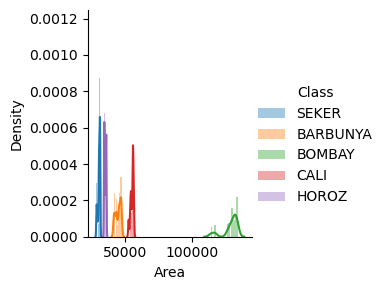

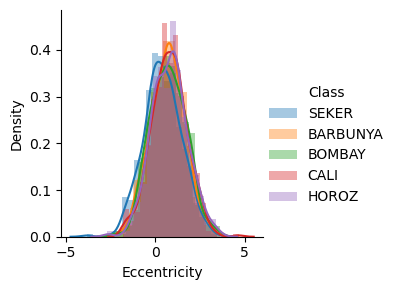

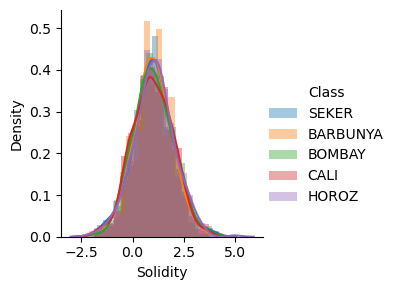

In [5]:
sns.FacetGrid(iris,hue="Class",height=3).map(sns.distplot,"Area").add_legend()
sns.FacetGrid(iris,hue="Class",height=3).map(sns.distplot,"Eccentricity").add_legend()
sns.FacetGrid(iris,hue="Class",height=3).map(sns.distplot,"Solidity").add_legend()
plt.show()

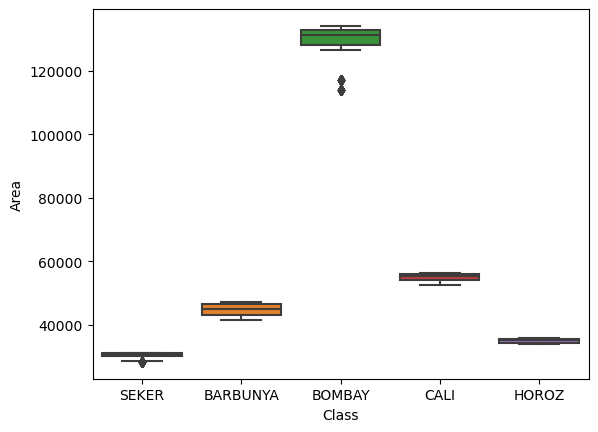

In [6]:
sns.boxplot(x="Class",y="Area",data=iris)
plt.show()

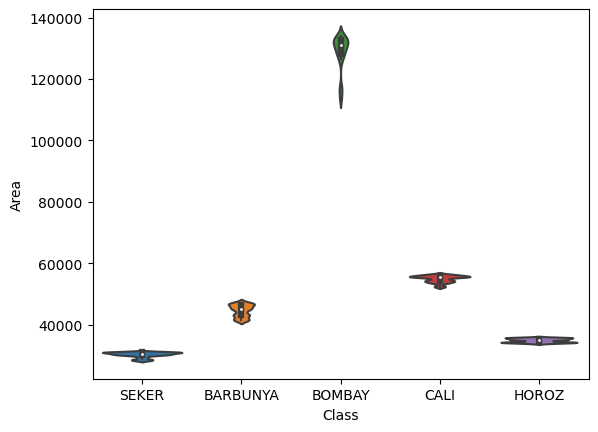

In [7]:
sns.violinplot(x="Class",y="Area",data=iris)
plt.show()

/Users/maqowais/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:2095: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)
/Users/maqowais/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


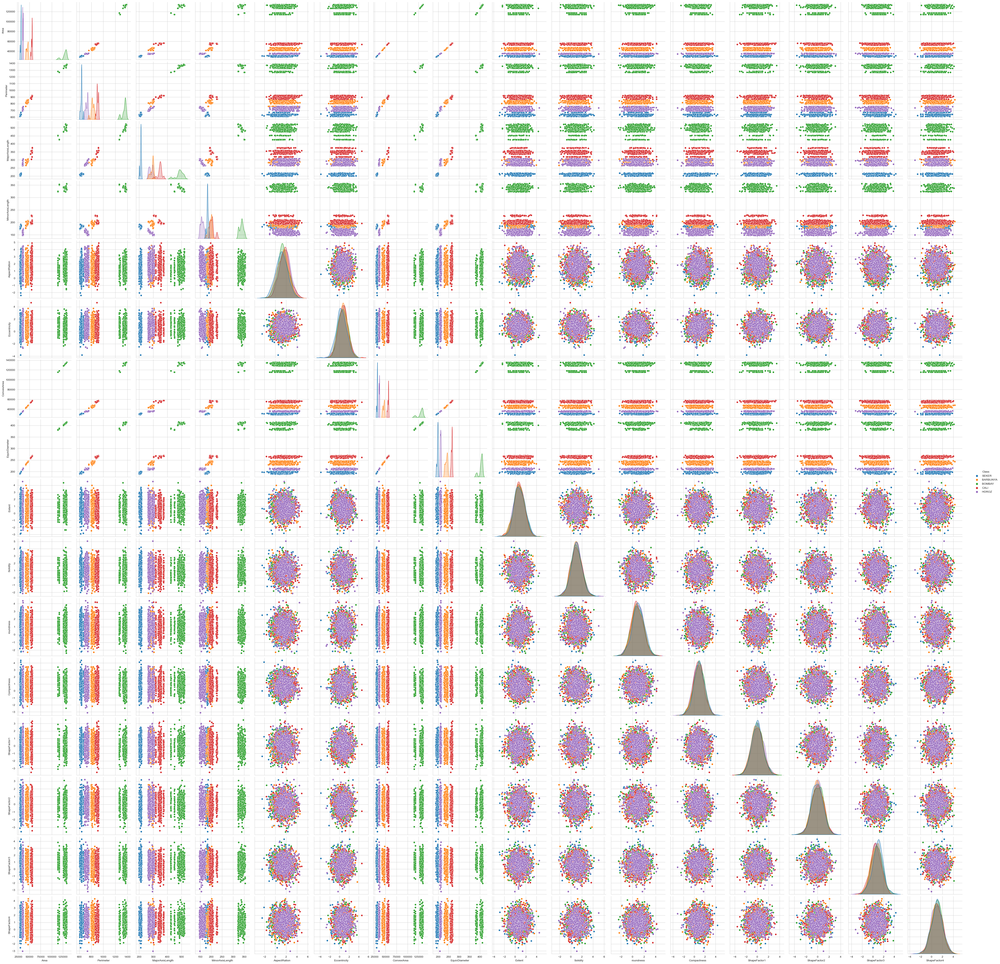

In [8]:
sns.set_style("whitegrid")
sns.pairplot(iris,hue="Class",size=3);
plt.show()

In [9]:
#Finding the optimum number of clusters for k-means classification
from sklearn.cluster import KMeans
wcss = []

for i in range(1, 11):
    kmeans = KMeans(n_clusters = i, init = 'k-means++', max_iter = 300, n_init = 10, random_state = 0)
    kmeans.fit(x)
    wcss.append(kmeans.inertia_)


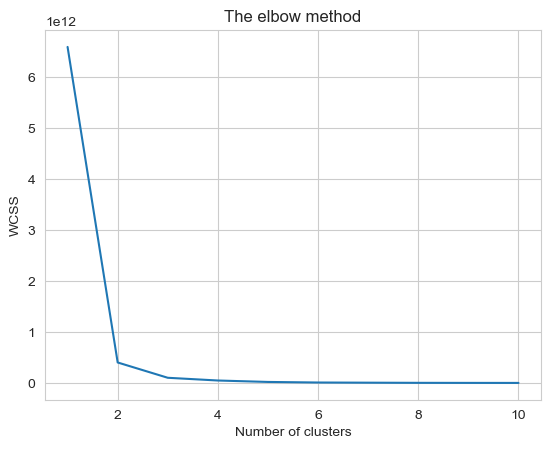

In [10]:
plt.plot(range(1, 11), wcss)
plt.title('The elbow method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS') #within cluster sum of squares
plt.show()


In [11]:
kmeans = KMeans(n_clusters = 5, init = 'k-means++', max_iter = 300, n_init = 10, random_state = 0)
y_kmeans = kmeans.fit_predict(x)

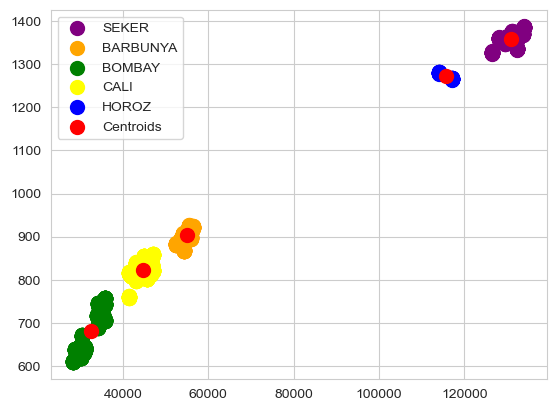

In [12]:
# iris_1=iris.loc[iris["Class"]=="SEKER"]
# iris_2=iris.loc[iris["Class"]=="BARBUNYA"]
# iris_3=iris.loc[iris["Class"]=="BOMBAY"]
# iris_4=iris.loc[iris["Class"]=="CALI"]
# iris_5=iris.loc[iris["Class"]=="HOROZ"]
#Visualising the clusters
plt.scatter(x[y_kmeans == 0, 0], x[y_kmeans == 0, 1], s = 100, c = 'purple', label = 'SEKER')
plt.scatter(x[y_kmeans == 1, 0], x[y_kmeans == 1, 1], s = 100, c = 'orange', label = 'BARBUNYA')
plt.scatter(x[y_kmeans == 2, 0], x[y_kmeans == 2, 1], s = 100, c = 'green', label = 'BOMBAY')
plt.scatter(x[y_kmeans == 3, 0], x[y_kmeans == 3, 1], s = 100, c = 'yellow', label = 'CALI')
plt.scatter(x[y_kmeans == 4, 0], x[y_kmeans == 4, 1], s = 100, c = 'blue', label = 'HOROZ')

#Plotting the centroids of the clusters
plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:,1], s = 100, c = 'red', label = 'Centroids')

plt.legend()

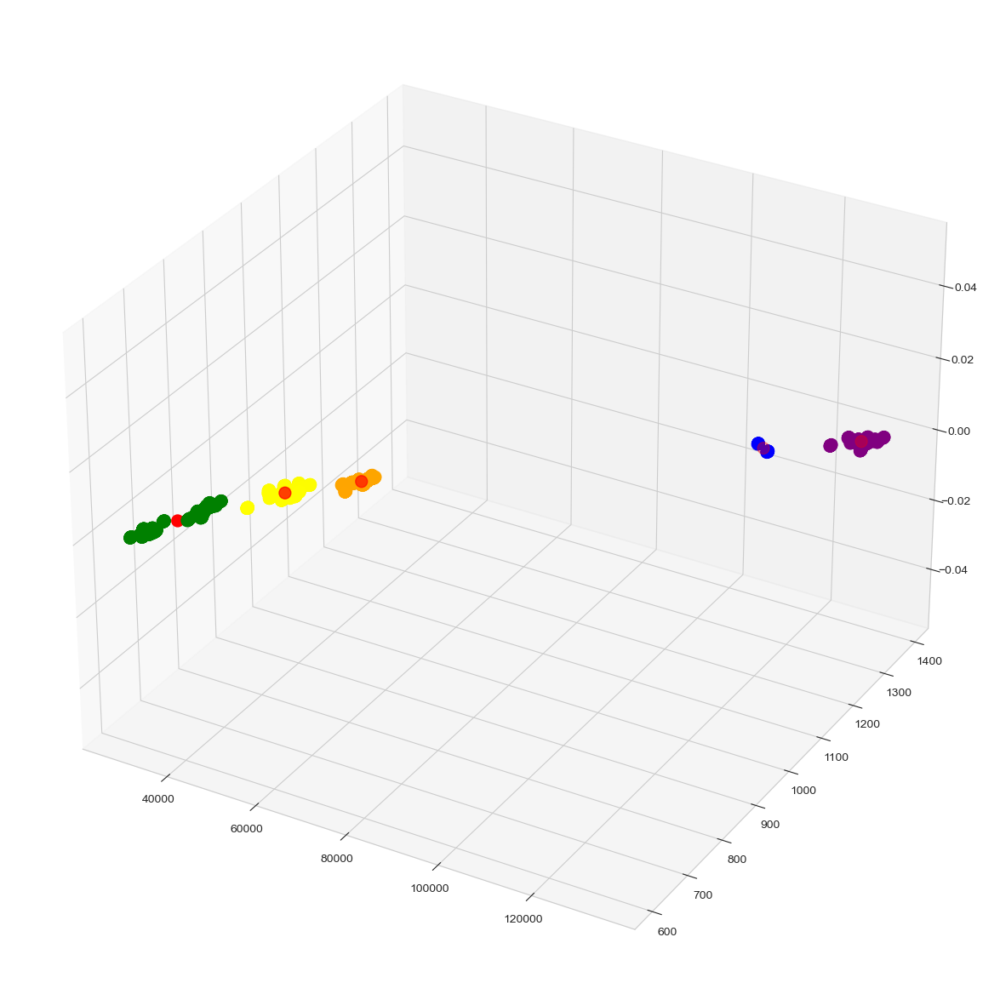

In [13]:
# 3d scatterplot using matplotlib

fig = plt.figure(figsize = (15,15))
ax = fig.add_subplot(111, projection='3d')
# plt.scatter(x[y_kmeans == 0, 0], x[y_kmeans == 0, 1], s = 100, c = 'purple', label = 'Iris-setosa')
# plt.scatter(x[y_kmeans == 1, 0], x[y_kmeans == 1, 1], s = 100, c = 'orange', label = 'Iris-versicolour')
# plt.scatter(x[y_kmeans == 2, 0], x[y_kmeans == 2, 1], s = 100, c = 'green', label = 'Iris-virginica')

plt.scatter(x[y_kmeans == 0, 0], x[y_kmeans == 0, 1], s = 100, c = 'purple', label = 'SEKER')
plt.scatter(x[y_kmeans == 1, 0], x[y_kmeans == 1, 1], s = 100, c = 'orange', label = 'BARBUNYA')
plt.scatter(x[y_kmeans == 2, 0], x[y_kmeans == 2, 1], s = 100, c = 'green', label = 'BOMBAY')
plt.scatter(x[y_kmeans == 3, 0], x[y_kmeans == 3, 1], s = 100, c = 'yellow', label = 'CALI')
plt.scatter(x[y_kmeans == 4, 0], x[y_kmeans == 4, 1], s = 100, c = 'blue', label = 'HOROZ')

#Plotting the centroids of the clusters
plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:,1], s = 100, c = 'red', label = 'Centroids')
plt.show()